In [ ]:
!pip3 install open3d
!pip install pyntcloud

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 346.3/346.3 kB 6.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt
import os
import open3d as o3d
from pyntcloud import PyntCloud

/usr/local/lib/python3.10/dist-packages/pyntcloud/utils/numba.py:5: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def groupby_count(xyz, indices, out):
/usr/local/lib/python3.10/dist-packages/pyntcloud/utils/numba.py:12: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def groupby_sum(xyz, indices, N, out):
/usr/local/lib/python3.10/dist-packages/pyntcloud/utils/nu

In [ ]:
lidar_paths = []
camera_images_paths = []
camera_param_paths = []

lidar_root = 'drive/MyDrive/CV_HW2/CV-A2-calibration/lidar_scans'
for p in os.listdir(lidar_root):
    lidar_paths.append(os.path.join(lidar_root, p))

camera_images = 'drive/MyDrive/CV_HW2/CV-A2-calibration/camera_images'
for p in os.listdir(camera_images):
    camera_images_paths.append(os.path.join(camera_images, p))

camera_params = 'drive/MyDrive/CV_HW2/CV-A2-calibration/camera_parameters'
for p in os.listdir(camera_params):
    if '.jpeg' in p:
        camera_param_paths.append(os.path.join(camera_params, p))

In [ ]:
lidar_paths = sorted(lidar_paths)
camera_images_paths = sorted(camera_images_paths)
camera_param_paths = sorted(camera_param_paths)

In [ ]:
def compute_plane_normal_and_offset(pcd_file):
    pcd = o3d.io.read_point_cloud(lidar_path)
    points = np.asarray(pcd.points)
    mean_point = np.mean(points, axis=0)
    centered = points - mean_point

    U, S, Vt = np.linalg.svd(np.dot(centered.T, centered), full_matrices = False)

    normal_vector = U[:, 2]

    d = np.dot(normal_vector, mean_point)
    if d < 0:
        d = -d
        normal_vector = -normal_vector

    return normal_vector, d

In [ ]:
lidar_normals = []
offsets = []
for lidar_path in lidar_paths:
    normal_vector, offset = compute_plane_normal_and_offset(lidar_path)
    lidar_normals.append(normal_vector)
    offsets.append(offset)
    print(f"Normal Vector: {normal_vector}")
    print(f"Normal Offset: {offset}")

Normal Vector: [ 0.63693437 -0.76499839  0.09535237]
Normal Offset: 4.993811298096004
Normal Vector: [ 0.70169742 -0.70118932  0.1263102 ]
Normal Offset: 4.72077965972876
Normal Vector: [ 0.93809241 -0.22958973  0.25936688]
Normal Offset: 5.204305546806318
Normal Vector: [ 0.72352642 -0.68812782 -0.05467752]
Normal Offset: 4.7935016262124694
Normal Vector: [ 0.83333533 -0.55208241  0.02751785]
Normal Offset: 5.220803337324182
Normal Vector: [ 0.91935323 -0.3607026   0.15710911]
Normal Offset: 5.702524575286329
Normal Vector: [0.94151039 0.18949708 0.27865578]
Normal Offset: 6.323572215248567
Normal Vector: [ 0.81878735  0.50763718 -0.26812639]
Normal Offset: 6.445439719171264
Normal Vector: [ 0.93288206 -0.2440387   0.26490788]
Normal Offset: 5.6742584632412605
Normal Vector: [ 0.95207118 -0.1539658   0.26430097]
Normal Offset: 5.743694294895788
Normal Vector: [ 0.60407281 -0.77412903  0.18926246]
Normal Offset: 5.062352211986537
Normal Vector: [ 0.75932657 -0.56254883  0.32705042]
Nor

In [ ]:
alpha_camera, camera_normals  = [], []
for cam_params in camera_param_paths:
    tvec = np.array(np.loadtxt(os.path.join(cam_params, "translation_vectors.txt")))
    normals = np.array(np.loadtxt(os.path.join(cam_params, "camera_normals.txt")))
    alpha_cam = np.dot(tvec, normals.T)

    if(alpha_cam < 0):
        alpha_cam = -alpha_cam
        normals = -normals
    camera_normals.append(normals)
    alpha_camera.append(alpha_cam)



In [223]:
alpha_c = np.array(alpha_camera)
alpha_l = np.array(offsets)
theta_l = np.array(lidar_normals)
theta_c = np.array(camera_normals)

In [222]:
theta_c

array([ 0.64371721, -0.07551619,  0.76152837])

In [ ]:
print(theta_c.shape)

(38, 3)


In [ ]:
normals_dot = np.dot(theta_l.T, theta_c)
U, S, V = np.linalg.svd(normals_dot)
R1 = np.dot(V.T, U.T)
inverse = np.linalg.inv(np.dot(theta_c.T, theta_c))
mid = np.dot(inverse, theta_c.T )
t1 = np.dot(mid, (alpha_c - alpha_l))

In [ ]:
print(R1, t1)

[[-1.75158876e-01 -9.84540172e-01  1.36164316e-04]
 [ 1.53559935e-02 -2.87025999e-03 -9.99877970e-01]
 [ 9.84420419e-01 -1.75135410e-01  1.56213440e-02]] [ 0.08855656 -0.36208144 -0.59925671]


In [ ]:
cTl = np.zeros((4,4))
cTl[:3,:3] = R1
cTl[:3,3] = t1
cTl[3][3] = 1
print("estimated transformation matrix:")
print(cTl)

estimated transformation matrix:
[[-1.75158876e-01 -9.84540172e-01  1.36164316e-04  8.85565624e-02]
 [ 1.53559935e-02 -2.87025999e-03 -9.99877970e-01 -3.62081439e-01]
 [ 9.84420419e-01 -1.75135410e-01  1.56213440e-02 -5.99256711e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [ ]:
camera_intrinsic = np.array(np.loadtxt(os.path.join(camera_params, "camera_intrinsic.txt")))
distortion = np.array(np.loadtxt(os.path.join(camera_params, "distortion.txt")))

In [250]:
projected_points = []
i = 0

for lidar_path in lidar_paths:
    pcd = o3d.io.read_point_cloud(lidar_path)
    points = np.asarray(pcd.points)
    img = cv.imread(camera_images_paths[i])
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    ret, corners = cv.findChessboardCorners(gray, (8, 6), None)

    ones = np.ones((points.shape[0], 1))
    points_homogeneous = np.hstack((points, ones))

    camera_points_homogeneous = np.dot(cTl, points_homogeneous.T)

    camera_points = camera_points_homogeneous[:3, :] / camera_points_homogeneous[3, :]


    image_points = np.dot(camera_intrinsic, camera_points)
    image_points = image_points[:2, :] / image_points[2, :]

    if ret:
        projected_points.append(image_points.T)

    i += 1


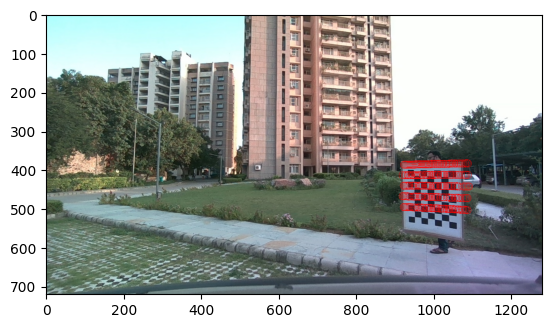

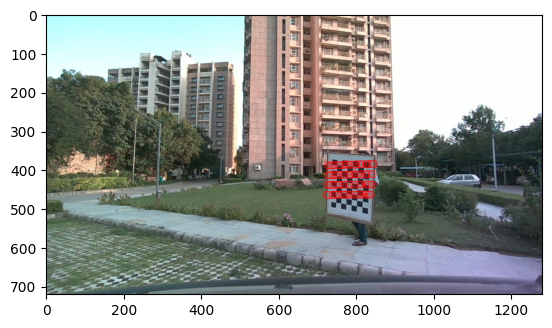

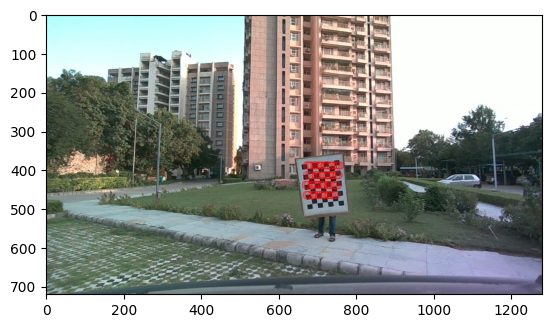

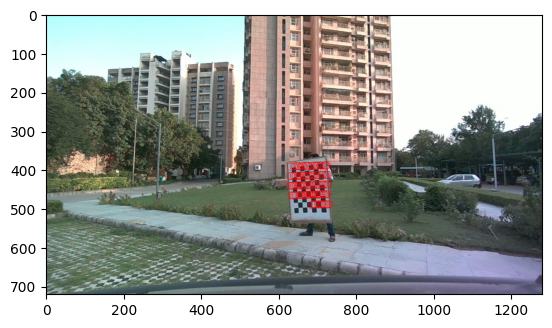

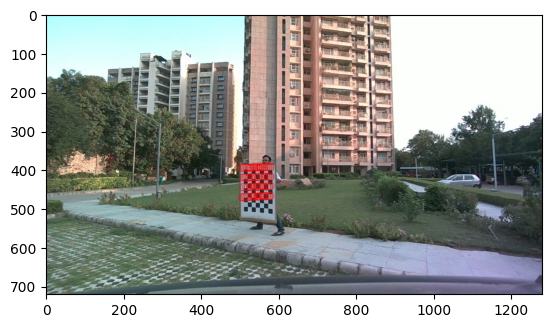

...

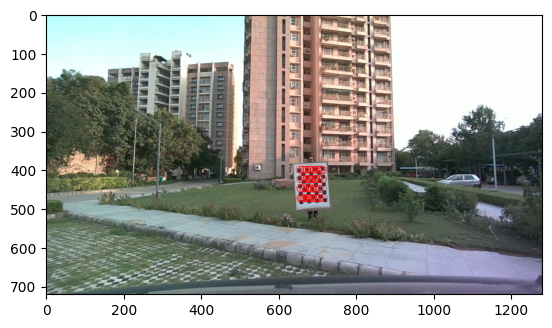

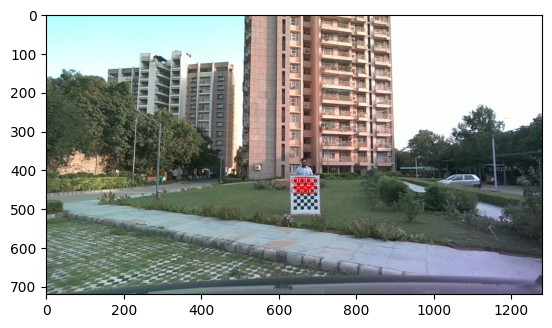

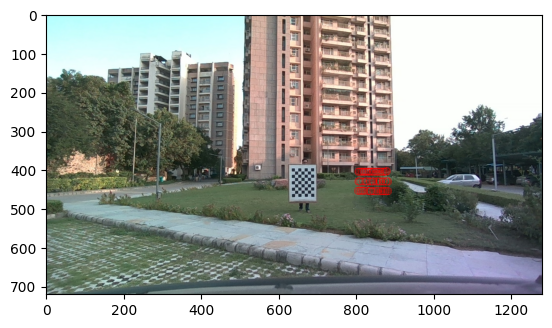

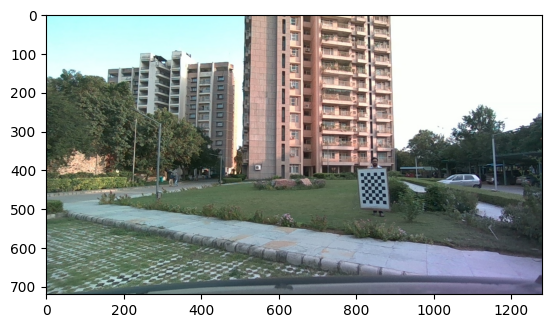

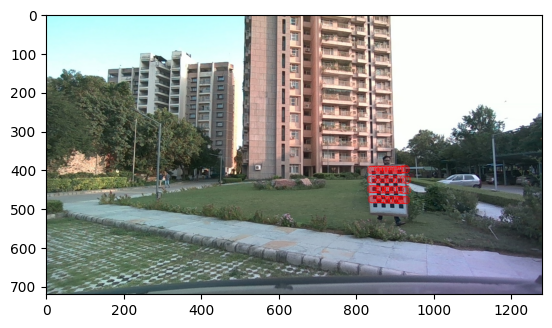

In [ ]:
i = 0
for cam_path in camera_images_paths:

    img = cv.imread(cam_path)
    gray = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    ret, corners =cv.findChessboardCorners(gray, (8, 6), None)
    if(ret == True):
        points = projected_points[i]
        i += 1
        for p in points:
            cv.circle(gray, (int(p[0]), int(p[1])), 10, (255, 0, 0), 1)

    plt.imshow(gray)
    plt.show()

In [229]:
print(theta_c.shape)

(38, 3)


In [230]:
print(theta_c)

[[ 0.64371721 -0.07551619  0.76152837]
 [ 0.57046552 -0.10565079  0.814498  ]
 [ 0.05275962 -0.22970552  0.9718291 ]
 [ 0.55917687  0.07439273  0.82570391]
 [ 0.40008835 -0.00687634  0.91645078]
 [ 0.18954575 -0.13129915  0.97305341]
 [-0.34835151 -0.25517693  0.90196228]
 [-0.65789388  0.28542777  0.69692656]
 [ 0.06913268 -0.23786099  0.96883581]
 [-0.00739864 -0.25390736  0.96720024]
 [ 0.65477401 -0.164822    0.73763454]
 [ 0.42402941 -0.31924201  0.84751613]
 [ 0.68682933  0.43663579  0.58104618]
 [ 0.73875133  0.10276552  0.66609738]
 [ 0.795691   -0.24197359  0.55526986]
 [ 0.06925356  0.07564818  0.99472675]
 [ 0.24936746 -0.22474881  0.94196807]
 [ 0.13917323  0.2935912   0.94574575]
 [-0.29001348 -0.28627248  0.91320329]
 [-0.27176261  0.16526395  0.94806799]
 [-0.56540183  0.19615303  0.80115215]
 [-0.16303408  0.29304993  0.94209428]
 [-0.39126525  0.23402562  0.89002445]
 [ 0.81629617 -0.09162133  0.57032105]
 [ 0.45613391  0.00554963  0.88989385]
 [ 0.65671387 -0.05477644

In [235]:
print(theta_c[1])

[ 0.57046552 -0.10565079  0.814498  ]


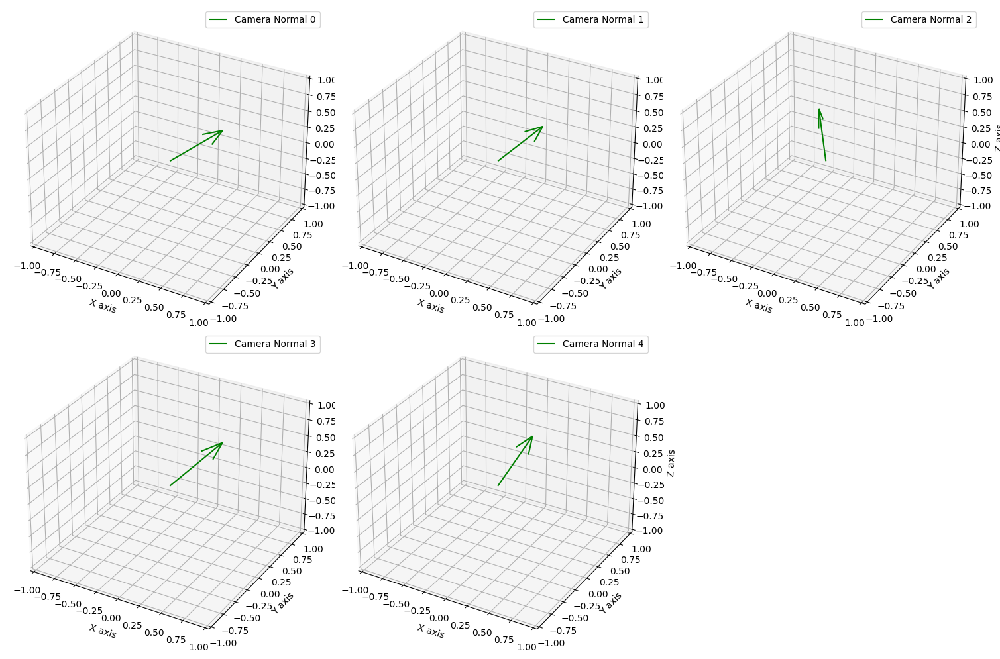

In [236]:
fig = plt.figure(figsize=(15, 10))
lidar_normals_transformed = np.dot(theta_l, R1.T)

for i in range(5):
    ax = fig.add_subplot(2, 3, i+1, projection='3d')

    camera_normal = theta_c[i] / np.linalg.norm(theta_c[i])


    ax.quiver(0, 0, 0, camera_normal[0], camera_normal[1], camera_normal[2], color='g', label=f'Camera Normal {i}')

    ax.set_xlim([-1, 1])
    ax.set_ylim([-1, 1])
    ax.set_zlim([-1, 1])
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    ax.legend()

plt.tight_layout()
plt.show()


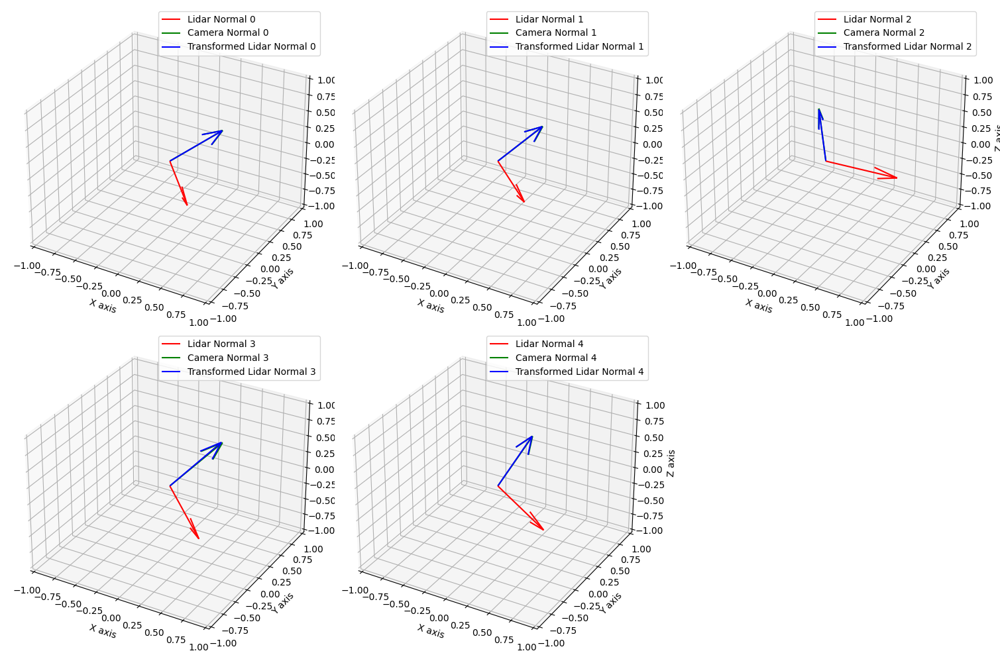

In [240]:
fig = plt.figure(figsize=(15, 10))
lidar_normals_transformed = np.dot(theta_l, R1.T)

for i in range(5):
    ax = fig.add_subplot(2, 3, i+1, projection='3d')

    camera_normal = theta_c[i] / np.linalg.norm(theta_c[i])

    ax.quiver(0, 0, 0, lidar_normals[i][0], lidar_normals[i][1], lidar_normals[i][2], color='r', label=f'Lidar Normal {i}')
    ax.quiver(0, 0, 0, camera_normal[0], camera_normal[1], camera_normal[2], color='g', label=f'Camera Normal {i}')
    ax.quiver(0, 0, 0, lidar_normals_transformed[i][0], lidar_normals_transformed[i][1], lidar_normals_transformed[i][2], color='b', label=f'Transformed Lidar Normal {i}')

    ax.set_xlim([-1, 1])
    ax.set_ylim([-1, 1])
    ax.set_zlim([-1, 1])
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    ax.legend()

plt.tight_layout()
plt.show()


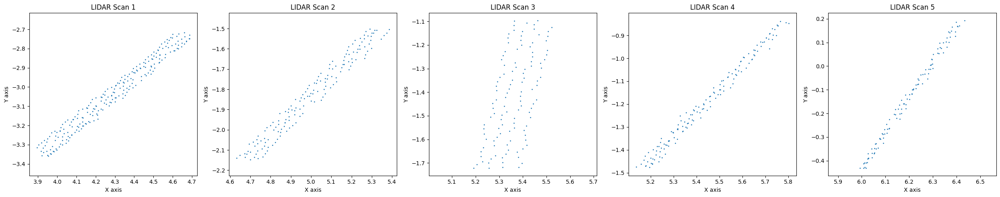

In [249]:
lidar_paths_scans = lidar_paths[:5]

fig, axes = plt.subplots(1, 5, figsize=(25, 5))

for i, file_path in enumerate(lidar_paths_scans):
    pcd = o3d.io.read_point_cloud(file_path)

    lidar_data = np.asarray(pcd.points)
    geom = o3d.geometry.PointCloud()
    geom.points = o3d.utility.Vector3dVector(lidar_data)
    o3d.visualization.draw_plotly([geom])


    axes[i].scatter(lidar_data[:, 0], lidar_data[:, 1], s=1)


    axes[i].set_title(f'LIDAR Scan {i+1}')
    axes[i].set_xlabel('X axis')
    axes[i].set_ylabel('Y axis')
    axes[i].axis('equal')

plt.tight_layout()
plt.show()

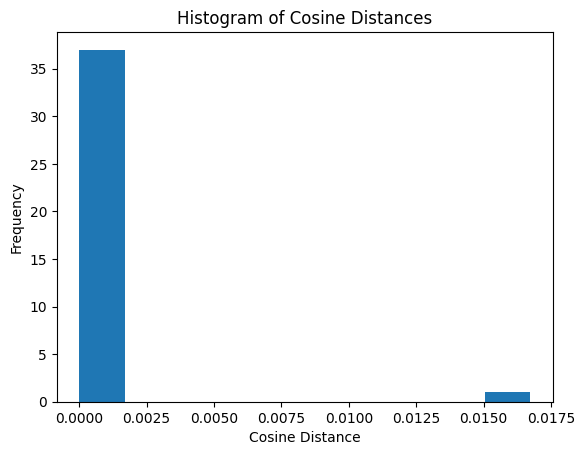

Average Error: 0.0006469021634402106
Standard Deviation: 0.0026610000720887644


In [ ]:
lidar_normals_transformed = np.dot(theta_l, R1.T)

cosine_distances = []

for i in range(38):
    dst = 1 - (np.dot(camera_normals[i], lidar_normals_transformed[i]) / (np.linalg.norm(camera_normals[i]) * np.linalg.norm(lidar_normals_transformed[i])))
    cosine_distances.append(dst)


plt.hist(cosine_distances)
plt.title('Histogram of Cosine Distances')
plt.xlabel('Cosine Distance')
plt.ylabel('Frequency')
plt.show()

average_error = np.mean(cosine_distances)
std_deviation = np.std(cosine_distances)

print(f"Average Error: {average_error}")
print(f"Standard Deviation: {std_deviation}")